### Probability estimators

#### Integration

In [51]:
using HCubature
function get_collision_probability_node2(n1,t1,n2,t2,nn,lambda;bound_radius=50)

    function h(x)
        y = x[1]
        t = x[2]
        density = (1-cdf(Gamma(nn,lambda),abs(t2-t1-y))) * pdf(Gamma(n1,lambda), t) * pdf(Gamma(n2,lambda),t-y)
        return density
    end

    a = [-100.0;0.0]
    b = [0.0,100.0]
    m = [0.0;0.0]
    n = [100.0,100.0]
    
    
    #bound = max(t1+n1,t2+n2)*lambda + 30.0
    bound = bound_radius
    
    o = bound.*[-1.0,-0.0]
    p = bound.*[1.0,1.0]

    C, err = hcubature(h,o,p,maxevals=10^8)

    return C, err
end

function get_collision_probability_node_newInt(n1,t1,n2,t2,nn,lambda;bound_radius=30.0)

    function h(x)
        y = x[1]
        t = x[2]
        density = (1-cdf(Gamma(nn,lambda),abs(t2-t1-y))) * pdf(Gamma(n1,lambda), t) * pdf(Gamma(n2,lambda),t-y)
        return density
    end
    
    #t1b = abs((-n1*n2 + n1 + n2 - 1)*lambda/(1-n1))
    #y1 = abs(t1b - (n1-1)*lambda)
    tmax = (-n1*n2 + n1 + n2 - 1)*lambda/(1-n1)
    ymax = tmax - (n1-1)*lambda
    
    yleft = min(ymax,t1-t2)
    yright = max(ymax,t1-t2)
    
    tleft = max(0,min(tmax,t1-t2+(n1-1)/lambda))
    tright=max(0,max(tmax,t1-t2+(n1-1)/lambda))
    
    v = max(ymax,tmax)
    
    #o = bound_radius.*[-1.0,0] .+ [yminmax,tminmax]
    o = bound_radius.*[-1.0,-0.0] .- [v,0.0]
    p = bound_radius.*[1.0,1.0] .+ [v,v]
    
    left = [yleft-bound_radius,max(tleft-bound_radius,0)]
    right = [yright + bound_radius, tright+bound_radius]
    

    C, err = hcubature(h,left,right,maxevals=10^8)

    return C, err
end

get_collision_probability_node_newInt (generic function with 1 method)

#### Monte Carlo

In [47]:
using Distributions
function count_conflicts(n1,t1,n2,t2,nn,lambda,num_particles)
    EA1 = rand(Gamma(n1,lambda),num_particles)
    EA2 = rand(Gamma(n2,lambda),num_particles)
    ed1 = rand(Gamma(nn,lambda),num_particles)
    ed2 = rand(Gamma(nn,lambda),num_particles)
    
    r1_arrivals = t1 .+ EA1
    r1_departures = r1_arrivals + ed1
    r2_arrivals = t2 .+ EA2
    r2_departures = r2_arrivals + ed2
    
    num_conflicts =length(findall(((r2_departures-r1_arrivals).>0) .& ((r1_departures-r2_arrivals).>0)   ))
    
    return num_conflicts/num_particles
end

count_conflicts (generic function with 1 method)

In [64]:
n1= 9 
t1= 26.46920341249225 
n2= 29 
t2= 2.2292175271679815 
nn= 7 
lambda= 0.6250771499863648

0.6250771499863648

In [65]:
get_collision_probability_node2(n1,t1,n2,t2,nn,lambda;bound_radius=50)

(0.044276875876976124, 6.581200363244071e-10)

In [66]:
get_collision_probability_node_newInt(n1,t1,n2,t2,nn,lambda;bound_radius=50)

(0.044276875819528244, 6.577554965051113e-10)

In [67]:
count_conflicts(n1,t1,n2,t2,nn,lambda,10000)

0.0463

### Probability evaluation

#### Averaged convergence plot

Exception case occured! Returned something really wrong.
n1: 9 t1: 26.46920341249225 n2: 29 t2: 2.2292175271679815 nn: 7 lambda: 0.6250771499863648
Exception case occured! Returned something really wrong.
n1: 9 t1: 26.46920341249225 n2: 29 t2: 2.2292175271679815 nn: 7 lambda: 0.6250771499863648
Exception case occured! Returned something really wrong.
n1: 9 t1: 26.46920341249225 n2: 29 t2: 2.2292175271679815 nn: 7 lambda: 0.6250771499863648
Exception case occured! Returned something really wrong.
n1: 9 t1: 26.46920341249225 n2: 29 t2: 2.2292175271679815 nn: 7 lambda: 0.6250771499863648
Exception case occured! Returned something really wrong.
n1: 9 t1: 26.46920341249225 n2: 29 t2: 2.2292175271679815 nn: 7 lambda: 0.6250771499863648


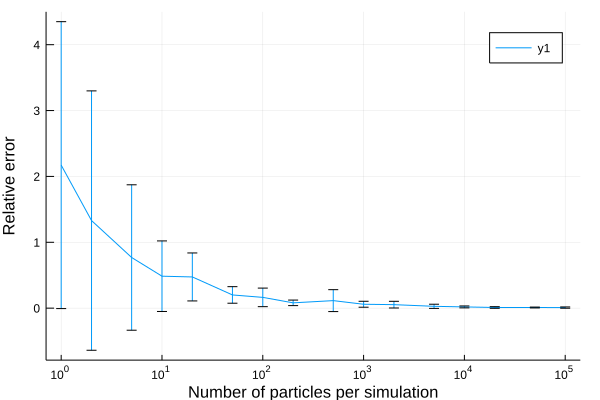

In [63]:
using DataFrames
using Statistics
using Plots
df = DataFrame(num_particles=Int64[],cp=Float64[],experimental_cp=Float64[],etas=Float64[])
x_list = [1,2,5,10,20,50,100,200,500,1000,2000,5000,10000,20000,50000,100000]
max_attempts = 10000

# Defining global variables
n1 = 0
n2 = 0
t1 = 0
t2 = 0
nn = 0
lambda = 0

for k in 1:10

    theoretical_cp = 0.0
    attempts = 0

    while theoretical_cp < 0.001 && attempts < max_attempts
        n1 = rand(2:51)
        t1 = rand()*50
        n2 = rand(1:50)
        t2 = rand()*50
        nn = rand(1:10)
        lambda = rand()
        theoretical_cp = get_collision_probability_node_newInt(n1,t1,n2,t2,nn,lambda)[1]
        attempts += 1

    end
    for x in x_list
        
        experimental_cp = count_conflicts(n1,t1,n2,t2,nn,lambda,x)
        ecart_relatif = abs(experimental_cp-theoretical_cp)/theoretical_cp
        if abs(ecart_relatif) > 0.5 && x > 2000
            println("Exception case occured! Returned something really wrong.")
            println("n1: ", n1, " t1: ", t1, " n2: ", n2, " t2: ", t2, " nn: ", nn, " lambda: ", lambda)
        end
        push!(df,[x,theoretical_cp,experimental_cp,ecart_relatif])
    end
end

ys = []
stds = []
for x in x_list
    indexes = findall((df[1].==x) .& (df[2] .> 0.01) .& (df[2] .< 1.0) .& (df[3] .> 0.01))
    values = df[4][indexes]
    y = mean(values)
    stdv = std(values)
    append!(ys,y)
    append!(stds,stdv)
end

plot(x_list,ys,yerror=stds,xscale = :log10,xlabel="Number of particles per simulation", ylabel="Relative error")

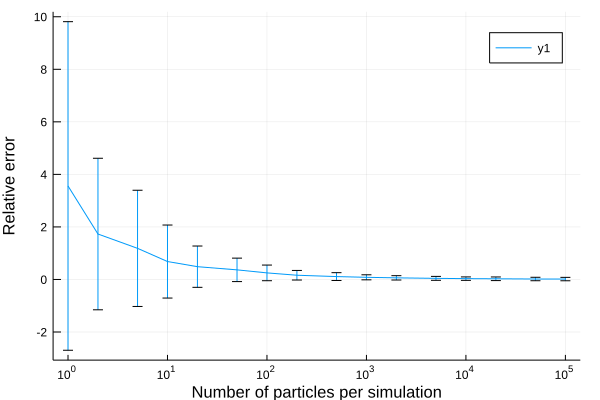

In [185]:
plot(x_list,ys,yerror=stds,xscale = :log10,xlabel="Number of particles per simulation", ylabel="Relative error")

### Time comparisons

Starting evaluations
20 %
40 %
60 %
80 %
100 %
120 %
140 %
160 %
180 %
200 %


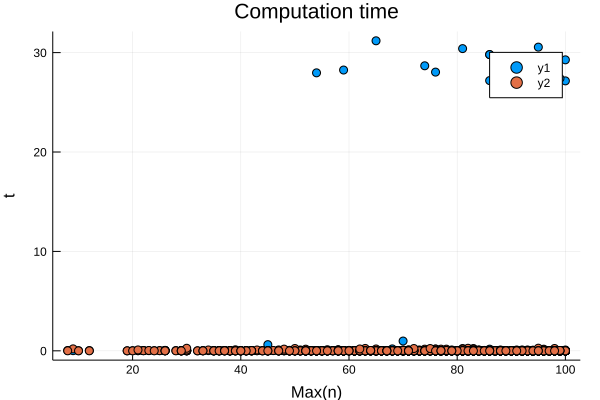

In [69]:
using DataFrames
using Statistics
using Plots
df_time2 = DataFrame(n1=Int64[],t1=Float64[],n2=Int64[],t2=Float64[],nn=Int64[],n_max=Int64[],lambda=Float64[],time_cp=Float64[],time_mc=Float64[],num_mc_particles=Float64[],errorMC_CP=Float64[],p_collision = Float64[])
x_list = [100,200,500,1000,2000,5000,10000,20000,50000,100000,200000,500000,1000000]
max_attempts = 10000

desired_precision = 10^(-3)

# Defining global variables
n1 = 0
n2 = 0
t1 = 0
t2 = 0
nn = 0
n_mx = 0
lambda = 0

println("Starting evaluations")

for k in 1:1000
    
    if k%100 == 0
        println(div(k,5), " %")
    end

    theoretical_cp = 0.0
    theoretical_time = 100000


    n1 = rand(2:100)
    t1 = rand()*20
    n2 = rand(2:100)
    t2 = rand()*20
    nn = rand(1:100)
    n_mx = maximum([n1,n2,nn])
    lambda = rand()
    theoretical_cp_tot = @timed get_collision_probability_node_newInt(n1,t1,n2,t2,nn,lambda)
    theoretical_cp = theoretical_cp_tot[1][1]
    theoretical_time = theoretical_cp_tot[2]


    # Make it global
    x = 0
    cp_time = 10000000
    
    x_counter = 2
    cp_old = count_conflicts(n1,t1,n2,t2,nn,lambda,x_list[1])
    cp_new = 10000
    
    while x_counter < 14 && abs(cp_old-cp_new) > desired_precision
        cp_old = cp_new
        
        x = x_list[x_counter]
        
        cp_new_t = @timed count_conflicts(n1,t1,n2,t2,nn,lambda,x)
        cp_new = cp_new_t[1]
        cp_time = cp_new_t[2]
        
        x_counter += 1

    end
    push!(df_time2, [n1,t1,n2,t2,nn,n_mx,lambda,theoretical_time,cp_time,x,abs(cp_new-theoretical_cp),cp_new])
    
end

scatter(df_time2[6],[df_time2[8],df_time2[9]],title="Computation time",xlabel="Max(n)",ylabel="t")


In [80]:
mean(df_time2[8][findall(df_time2.time_cp .< 10.0),:])

0.01525359614358452

In [73]:
histogram(df_time2[8])

In [72]:
df_time2

,n1,t1,n2,t2,nn,n_max,lambda,time_cp,time_mc,num_mc_particles,errorMC_CP,p_collision
,Int64,Float64,Int64,Float64,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64
1,7,11.0506,8,2.63273,9,9,0.913958,0.0152554,0.19719,1.0e6,0.000672075,0.554444
2,95,14.5855,88,10.7045,73,95,0.245592,0.0205874,0.000310661,2000.0,0.000276656,0.9995
3,50,8.41449,53,13.9589,88,88,0.352988,0.0197512,8.2268e-5,500.0,1.10798e-6,1.0
4,29,10.5724,19,7.1452,47,47,0.504865,0.0257109,0.000885284,5000.0,0.00017615,0.9994
5,28,6.64115,12,18.3015,36,36,0.421207,0.0308,9.4562e-5,500.0,0.00156862,1.0
6,94,2.49662,63,9.17104,4,94,0.186042,0.0657157,0.0192012,100000.0,0.000793464,0.22869
7,82,7.13491,38,16.9813,11,82,0.338929,0.0145295,0.256709,1.0e6,0.000210662,0.356221
8,65,7.98419,94,19.061,27,94,0.898524,0.0155303,0.0333607,200000.0,0.000180762,0.14629
9,39,14.1425,39,8.96006,18,39,0.536745,0.0175582,0.0344103,200000.0,0.00159404,0.80298


In [117]:
df_time[:][1:5,:]

,n1,t1,n2,t2,nn,n_max,lambda,time_cp,time_mc,num_mc_particles,errorMC_CP,p_collision,boundvalue,invNL
,Int64,Float64,Int64,Float64,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64
1,4,6.62207,54,9.50157,32,54,0.21282,1.55506,0.000339039,2000.0,5.10188e-5,0.0005,90,0.0870148
2,43,12.4698,22,3.51058,32,43,0.184799,0.0131182,8.4377e-5,500.0,0.000122073,0.0,60,0.125844
3,87,13.0013,20,7.25908,68,87,0.759319,0.0276953,0.0208552,100000.0,0.000396673,0.3088,200,0.0151376
4,52,2.42369,60,14.2236,40,60,0.446225,0.018832,0.0365558,200000.0,0.000976955,0.67198,220,0.0373503
5,43,19.2599,56,0.834076,7,56,0.809182,0.0123586,0.0102671,50000.0,0.000538297,0.33862,100,0.0220681


In [116]:
df_time.invNL = 1 ./ (df_time.n_max .* df_time.lambda)

20000-element Array{Float64,1}:
 0.08701478653074743 
 0.12584356102946737 
 0.0151375798526734  
 0.0373503370998487  
 0.022068148115793194
 0.010582928379550636
 0.017340401003631264
 0.05250253128766949 
 0.039669970118690674
 0.4122025369965011  
 0.045093906112587304
 0.016517734807014958
 0.010834750665322   
 ⋮                   
 5.827278271578303   
 0.06751846865273635 
 0.012487577716451164
 0.05160894527844587 
 0.08092654195377211 
 0.01714202599873898 
 0.020692627795599643
 0.07057884763200788 
 0.02661746413098556 
 0.028290954265992763
 0.0304474906703855  
 0.022358040548900733

In [149]:
df_time_2 = df_time[:][findall((df_time.n1.*df_time.lambda + df_time.t1) .> (df_time.n2.*df_time.lambda+df_time.t2)),:];

In [75]:
df_time2[:][findall(df_time2.errorMC_CP .> 0.01),:]

,n1,t1,n2,t2,nn,n_max,lambda,time_cp,time_mc,num_mc_particles,errorMC_CP,p_collision
,Int64,Float64,Int64,Float64,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64
1,56,3.48557,13,12.9595,87,87,0.326563,0.0306844,8.4536e-5,500.0,0.0114044,1.0
2,81,14.4568,59,15.8011,55,81,0.018292,1.257e-5,0.0325171,200000.0,0.596325,0.596325
3,44,14.2873,91,17.3038,84,91,0.950233,0.00790116,0.000154362,1000.0,0.845294,0.99
4,58,14.1796,6,15.0158,45,58,0.0493555,1.8772e-5,0.00277293,5000.0,0.8338,0.8338
5,99,12.6926,39,13.1771,93,99,0.714397,0.00801306,0.000300641,2000.0,0.936984,0.9905
6,39,14.3271,18,19.8006,99,99,0.765192,0.0174385,7.9479e-5,500.0,0.0734444,1.0
7,34,17.0744,93,16.5206,44,93,0.797806,0.00686276,0.00151955,10000.0,0.114235,0.136
8,94,19.0152,20,18.5549,67,94,0.938216,0.00693782,0.0190051,100000.0,0.287941,0.28796
9,50,11.4584,68,9.35596,90,90,0.695814,0.0157302,8.4699e-5,500.0,0.0219453,1.0


In [130]:
using GLM
ols = lm(@formula(time_cp ~ n1+n2+t1+t2+nn+lambda+n1*lambda+n2*lambda+n_max+invNL), df_time_2[:][1:3000,:])

StatsModels.DataFrameRegressionModel{LinearModel{LmResp{Array{Float64,1}},DensePredChol{Float64,LinearAlgebra.Cholesky{Float64,Array{Float64,2}}}},Array{Float64,2}}

Formula: time_cp ~ 1 + n1 + n2 + t1 + t2 + nn + lambda + n_max + invNL + n1 & lambda + n2 & lambda

Coefficients:
                 Estimate  Std.Error    t value Pr(>|t|)
(Intercept)      0.348399   0.380267   0.916196   0.3596
n1              0.0032158  0.0046327   0.694152   0.4876
n2             -0.0312142 0.00425815   -7.33046   <1e-12
t1              0.0566707  0.0103888    5.45497    <1e-7
t2             -0.0708291  0.0103683   -6.83129   <1e-10
nn              -0.021022 0.00246612   -8.52434   <1e-16
lambda          -0.836102   0.546611   -1.52961   0.1262
n_max           0.0296258 0.00516592    5.73485    <1e-7
invNL        -0.000630861 0.00669914 -0.0941704   0.9250
n1 & lambda    0.00642948 0.00798561   0.805133   0.4208
n2 & lambda  -0.000400178 0.00790405 -0.0506295   0.9596


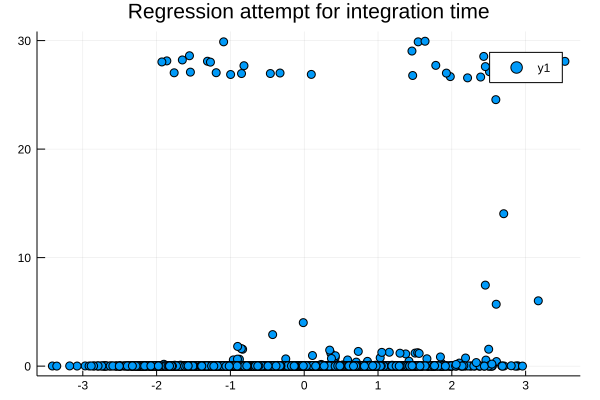

In [162]:
ys = df_time[8][1:3000]
xs = 0.35 .+ 0.003*df_time.n1[1:3000] - 0.03*df_time.n2[1:3000] + 0.056*df_time.t1[1:3000] - 0.07*df_time.t2[1:3000] - 0.021*df_time.nn[1:3000] - 0.83*df_time.lambda[1:3000] + 0.029*df_time.n_max[1:3000] + 0.006*df_time.n1[1:3000].*df_time.lambda[1:3000] - 0.0004*df_time.n2[1:3000].*df_time.lambda[1:3000]
scatter(xs,ys,title="Regression attempt for integration time")

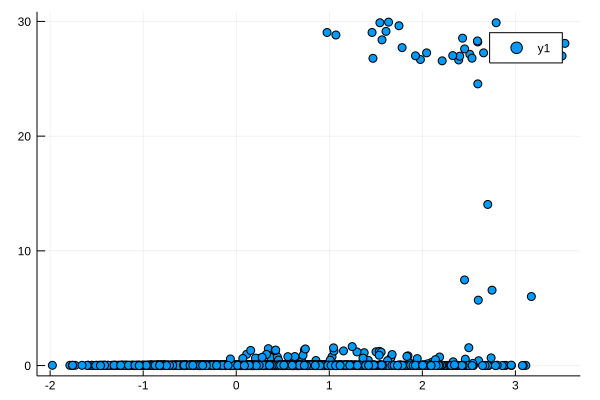

In [132]:
ys = df_time_2[8][1:3000]
xs = 0.35 .+ 0.003*df_time_2.n1[1:3000] - 0.03*df_time_2.n2[1:3000] + 0.056*df_time_2.t1[1:3000] - 0.07*df_time_2.t2[1:3000] - 0.021*df_time_2.nn[1:3000] - 0.83*df_time_2.lambda[1:3000] + 0.029*df_time_2.n_max[1:3000] + 0.006*df_time_2.n1[1:3000].*df_time_2.lambda[1:3000] - 0.0004*df_time_2.n2[1:3000].*df_time_2.lambda[1:3000]
scatter(xs,ys)

In [184]:
scatter(df_time_errorless.p_collision[1:9000], [df_time_errorless.time_cp[1:9000],df_time_errorless.time_mc[1:9000]],ylims=(0,1),xlabel="Collision Probability", ylabel="Time to calculate probability",title="Solving times for Monte Carlo (orange) vs. Integration (blue)")

In [154]:
scatter(df_time_errorless.p_collision[1:9000], df_time_errorless.time_cp[1:9000],ylims=(0,.1))

In [148]:
df_time[:][findall(df_time[8].< .001),:]

,n1,t1,n2,t2,nn,n_max,lambda,time_cp,time_mc,num_mc_particles,errorMC_CP,p_collision,boundvalue,invNL
,Int64,Float64,Int64,Float64,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Float64
1,25,4.52025,74,7.6695,83,83,0.303711,3.5371e-5,0.00166819,10000.0,0.9606,0.9606,260,0.03967
2,66,7.80733,9,15.7505,29,66,0.0367575,1.3503e-5,8.5289e-5,500.0,0.0,0.0,210,0.412203
3,9,10.4683,28,15.0893,65,65,0.0564452,1.6635e-5,8.3609e-5,500.0,0.0,0.0,260,0.272558
4,43,15.3,93,5.52304,60,93,0.088676,1.5165e-5,0.00837871,50000.0,0.48452,0.48452,160,0.121258
5,77,1.75232,11,18.8073,27,77,0.0871673,2.4451e-5,8.7227e-5,500.0,0.0,0.0,60,0.148989
6,4,18.4043,77,0.140194,72,77,0.216679,4.3425e-5,8.4697e-5,500.0,1.0,1.0,260,0.0599367
7,93,8.38839,38,9.84659,37,93,0.0368274,1.4676e-5,0.00957589,50000.0,0.95184,0.95184,260,0.291975
8,27,18.4538,70,5.74113,56,70,0.0866256,2.9585e-5,0.000957267,5000.0,0.0,0.0,220,0.164913
9,13,0.159167,52,8.7621,28,52,0.077408,2.9922e-5,8.472e-5,500.0,0.0,0.0,230,0.248434


#### Probability error as a function of chosen bound value

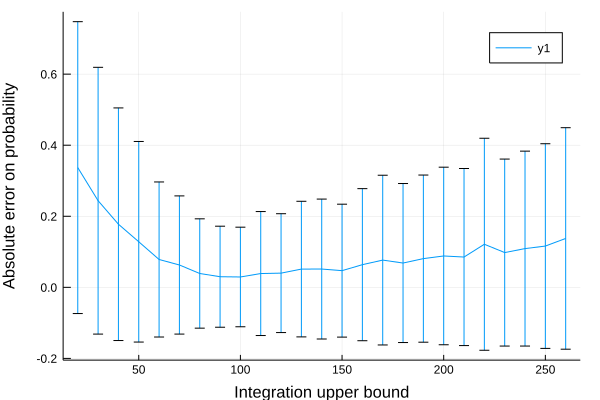

In [19]:
xs = collect(20 .+ 10*(0:24))
ys = []
y_stds = []
for x in xs
    y_idxs = findall(df_time[13].==x)
    meany = mean(df_time[y_idxs,11])
    stdy = std(df_time[y_idxs,11])
    append!(ys,meany)
    append!(y_stds,stdy)
end
plot(xs,ys,yerror = y_stds,xlabel="Integration upper bound", ylabel="Absolute error on probability")


In [74]:
length(findall(df_time[11].>0.1))/length(df_time[11])

0.025

In [18]:
mean(df_time[ys,5])

71.78782452999104

##### Save data

In [6]:
using CSV
CSV.write("Large_prob_test.csv",df_time)

"Large_prob_test.csv"